# Demo notebook for Niimpy Exploration layer modules

## Introduction

This notebook demonstrates Niimpy toolbox exploration layer module functionalities, including modules for [plotting catogorical data](#section_1), [data counts](#section_2), [timeseries lineplots](#section_3), [punchcards](#section_4) and [visualizing missing data.](#section_5)<br>
Modules contain visualization functions for different types of behavioral data.<br> All the functions are implemented by using [Plotly Python Open sourde Library](https://plotly.com/python/).
Exploratory data analysis functionalities summarize the main characteristics of the data. <br> User and group level behavioral patterns and changes in patters can be detected from visualizations. 
Functions are usefull for assessing the data quality (e.g., missing data, outliers).

#TODO! Add a table showing each module and accepted data types.

All eploration module functions require the data to follow [data schema.](https://niimpy.readthedocs.io/en/latest/schema/) defined in the Niimpy toolbox [documentation](https://niimpy.readthedocs.io/en/latest/).

#TODO! Add a table explaining the data schema.

This notebook uses several sample dataframes for module demonstration. The sample data is already preprocessed, or will be preprocessed in notebook sections before visualizations. <br> Some of the key characteristics of the data are displayed, when data is initially loaded.

This notebook uses following definitions referring to data:
* *Feature* refers to dataframe column that stores observations (e.g., numerical sensor values, questionnaire answers)
* *User* refers to unique identifier for each subject in the data. Dataframe should also have a column named as `user`.
* *Group* refers to unique group idenfier. If subjects are grouped, dataframe shoudl have a column named as `group`.




### Table of Contents

* [Section 1: Categorical plot](#section_1)
   * [Section 1.1 : Questionnaire summary](#section_1_1)
   * [Section 1.2 : Questionnaire grouped summary](#section_1_2)
   * [Section 1.3 : Questionnaire grouped summary score distribution](#section_1_3)
* [Section 2: Countplot](#section_2)
    * [Section 2.1 : User level observation count](#section_2_1)
    * [Section 2.2 : Group level observation count](#section_2_2)
    * [Section 2.3 : Group level value distribution](#section_2_3)
* [Section 3: Lineplot](#section_3)
    * [Section 3.1 : Lineplot](#section_3_1)
        * [Section 3.1.1 : Single user single feature](#section_3_1_1)
        * [Section 3.1.2 : Single user single feature reset index](#section_3_1_2)
        * [Section 3.1.3 : Single user single feature aggregated by day](#section_3_1_3)
    * [Section 3.2 : Multiple users single feature](#section_3_2)
    * [Section 3.3 : Group level hourly averages](#section_3_3)
    * [Section 3.4 : Group level weekday averages](#section_3_4)
* [Section 4: Punchcard](#section_4)
    * [Section 4.1 : Single user punchard](#section_4_1)
    * [Section 4.2 : Multiple user puchcard](#section_4_2)
    * [Section 4.3 : Single user punchcard showing two features](#section_4_3)    
* [Section 5: Missingness](#section_5)
    * [Section 5.1 : Data frequency by feature](#section_5_1)
    * [Section 5.2 : Average frequency by user](#section_5_2)
    * [Section 5.3 : Missingness matrix](#section_5_3)
    * [Section 5.4 : Missing data correlation](#section_5_4)


### Imports
At first we import modules needed for this notebook.

In [1]:
import os
import sys
sys.path.append('/scratch/cs/networks-nima-mmm2018/Arsi/niimpy_fork/niimpy')
sys.path.append('../')

from pathlib import Path
import numpy as np
import pandas as pd
import niimpy
import plotly
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio
import warnings
from niimpy.preprocessing.survey import *
from niimpy.exploration import EDA_categorical, EDA_countplot, EDA_lineplot, EDA_missingness, EDA_punchcard

### Plotly settings
We will define default settings for [plotly](https://plotly.com/python/) visualizations. Feel free to adjust the settings.

In [2]:
pio.templates.default = "seaborn"
px.defaults.template = "ggplot2"
px.defaults.color_continuous_scale = px.colors.sequential.RdBu
px.defaults.width = 1200
px.defaults.height = 482
warnings.filterwarnings("ignore")

## 1) Categorical plot <a class="anchor" id="section_1"></a>

This section introduces categorical plot module visualizes **categorical data**, such as questionnaire data responses.<br>
We will demonstrate functions by using a mock survey dataframe, containing answers for:
* *Patient Health Questionnaire-2 (PHQ-2)*
* *Perceived Stress Scale (PSS10)*
* *Generalized Anxiety Disorder-2 (GAD-2)*

The data will be preprocessed, and then it's basic characteristics will be summarized before visualizations.


In [3]:
# go to parent directory
os.chdir('..')
# Get the current working directory
cwd = os.getcwd()
# Define path for data
data_folder = os.path.join(cwd,"niimpy","sampledata","mock-survey.csv")

In [4]:
# Load a mock dataframe
df = niimpy.read_csv(data_folder,tz='Europe/Helsinki')
df.head()

,user,age,gender,Little interest or pleasure in doing things.,Feeling down; depressed or hopeless.,Feeling nervous; anxious or on edge.,Not being able to stop or control worrying.,In the last month; how often have you felt that you were unable to control the important things in your life?,In the last month; how often have you felt confident about your ability to handle your personal problems?,In the last month; how often have you felt that things were going your way?,In the last month; how often have you been able to control irritations in your life?,In the last month; how often have you felt that you were on top of things?,In the last month; how often have you been angered because of things that were outside of your control?,In the last month; how often have you felt difficulties were piling up so high that you could not overcome them?
0,1,20,Male,several-days,more-than-half-the-days,not-at-all,nearly-every-day,almost-never,sometimes,fairly-often,never,sometimes,very-often,fairly-often
1,2,32,Male,more-than-half-the-days,more-than-half-the-days,not-at-all,several-days,never,never,very-often,sometimes,never,fairly-often,never
2,3,15,Male,more-than-half-the-days,not-at-all,several-days,not-at-all,never,very-often,very-often,fairly-often,never,never,almost-never
3,4,35,Female,not-at-all,nearly-every-day,not-at-all,several-days,very-often,fairly-often,very-often,never,sometimes,never,fairly-often
4,5,23,Male,more-than-half-the-days,not-at-all,more-than-half-the-days,several-days,almost-never,very-often,almost-never,sometimes,sometimes,very-often,never


In [5]:
df.describe()

,user,age
count,1000.000000,1000.000000
mean,500.500000,26.911000
std,288.819436,4.992595
min,1.000000,12.000000
25%,250.750000,23.000000
50%,500.500000,27.000000
75%,750.250000,30.000000
max,1000.000000,43.000000


The dataframe's columns are raw questions from a survey. Some questions belong to a specific category, so we will annotate them with ids. <br> The id is constructed from a prefix (the questionnaire category: GAD, PHQ, PSQI etc.), followed by the question number (1,2,3). Similarly, we will also the answers to meaningful numerical values.

**Note:** It's important that the dataframe follows the below schema before passing into niimpy.

In [6]:
# Convert column name to id, based on provided mappers from niimpy
col_id = {**PHQ2_MAP, **PSQI_MAP, **PSS10_MAP, **PANAS_MAP, **GAD2_MAP}
selected_cols = [col for col in df.columns if col in col_id.keys()]

# Convert data frame to long format
m_df = pd.melt(df, id_vars=['user', 'age', 'gender'], value_vars=selected_cols, var_name='question', value_name='answer')

# Assign questions to codes 
m_df['id'] = m_df['question'].replace(col_id)
m_df.head()

,user,age,gender,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,several-days,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,not-at-all,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,more-than-half-the-days,PHQ2_1


We can use a helper method to convert the answers into numerical value. The pre-defined mapper inside survey.py would be useful for this step.

In [7]:
# Transform raw answers to numerical values
m_df['answer'] = niimpy.preprocessing.survey.convert_to_numerical_answer(m_df, answer_col = 'answer',
                                question_id = 'id', id_map=ID_MAP_PREFIX, use_prefix=True)
m_df.head()

,user,age,gender,question,answer,id
0,1,20,Male,Little interest or pleasure in doing things.,1,PHQ2_1
1,2,32,Male,Little interest or pleasure in doing things.,2,PHQ2_1
2,3,15,Male,Little interest or pleasure in doing things.,2,PHQ2_1
3,4,35,Female,Little interest or pleasure in doing things.,0,PHQ2_1
4,5,23,Male,Little interest or pleasure in doing things.,2,PHQ2_1


We can also produce a summary of the questionaire's score. This function can describe aggregated score over the whole population, or specific subgroups.

First we'll show statistics for the whole population:

In [8]:
d1 = niimpy.preprocessing.survey.print_statistic(m_df)
pd.DataFrame(d1)

,PSS10,GAD2,PHQ2
min,4.000000,0.000000,0.0000
max,27.000000,6.000000,6.0000
avg,14.006000,3.042000,3.0520
std,3.687759,1.536423,1.5855


Statistics by the group gender:

In [9]:
d2 = niimpy.preprocessing.survey.print_statistic(m_df, group='gender')
pd.DataFrame(d2)

PSS10                 GAD2                PHQ2          
        Female       Male    Female      Male    Female      Male
min   4.000000   4.000000  0.000000  0.000000  0.000000  0.000000
max  27.000000  23.000000  6.000000  6.000000  6.000000  6.000000
avg  14.059063  13.954813  3.087576  2.998035  3.067210  3.037328
std   3.783230   3.596247  1.585157  1.488141  1.605337  1.567567

And finally statistics for PHQ questionnaires by group:

In [10]:
d3 = niimpy.preprocessing.survey.print_statistic(m_df, group='gender', prefix='PHQ')
pd.DataFrame(d3)

PHQ          
       Female      Male
min  0.000000  0.000000
max  6.000000  6.000000
avg  3.067210  3.037328
std  1.605337  1.567567

## 1.1. Questionnaire summary <a class="anchor" id="section_1_1"></a>

We can now make some plots for the preprocessed data frame. First, we can display the summary for the specific question (*PHQ-2* first question).

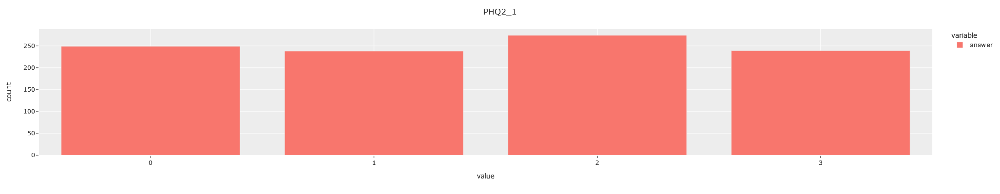

In [11]:
fig = EDA_categorical.questionnaire_summary(m_df, 
                                            question = 'PHQ2_1', 
                                            column = 'answer', 
                                            title='PHQ2_1', 
                                            xlabel='value', 
                                            ylabel='count', 
                                            width=600, 
                                            height=400)
fig.show()

## 1.2. Questionnaire grouped summary <a class="anchor" id="section_1_2"></a>

We can also display the summary for each subgroup (*gender*).

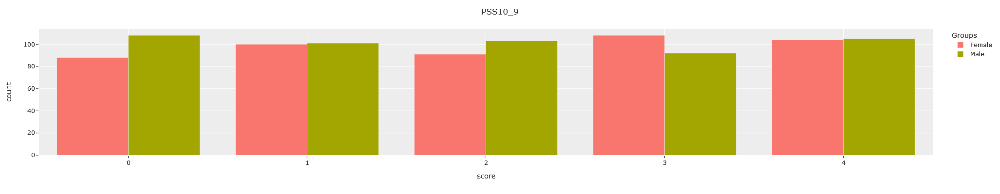

In [12]:
fig = EDA_categorical.questionnaire_grouped_summary(m_df, 
                                                    question='PSS10_9', 
                                                    group='gender', 
                                                    title='PSS10_9',
                                                    xlabel='score',
                                                    ylabel='count',
                                                    width=800,
                                                    height=400)
fig.show()

## 1.3. Questionnaire grouped summary score distribution <a class="anchor" id="section_1_3"></a>

With some quick preprocessing, we can display the score distribution of each questionaire.

We'll extract *PSS-10* questionnaire answers from the dataframe.

In [13]:
pss_sum_df = m_df[m_df['id'].str.startswith('PSS')] \
                            .groupby(['user', 'gender']) \
                            .agg({'answer':sum}) \
                            .reset_index()
pss_sum_df['id'] = 'PSS'

We'll quickly inspect the preprocessed dataframe. 

In [14]:
pss_sum_df

,user,gender,answer,id
0,1,Male,15,PSS
1,2,Male,9,PSS
2,3,Male,12,PSS
3,4,Female,16,PSS
4,5,Male,14,PSS
...,...,...,...,...
995,996,Female,17,PSS
996,997,Female,13,PSS
997,998,Male,13,PSS
998,999,Male,21,PSS


And then visualize grouped summary score distribution.

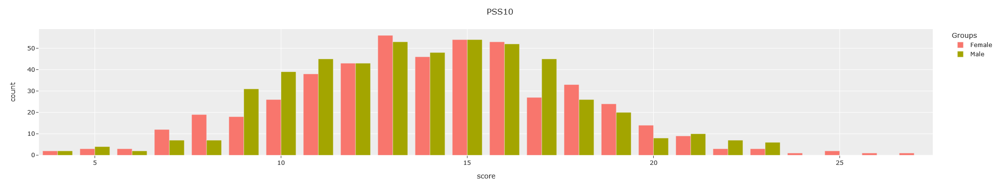

In [15]:
fig = EDA_categorical.questionnaire_grouped_summary(pss_sum_df, 
                                                    question='PSS', 
                                                    group='gender', 
                                                    title='PSS10',
                                                    xlabel='score', 
                                                    ylabel='count',
                                                    width=800, 
                                                    height=400)
fig.show()

## 2) Countplot <a class="anchor" id="section_2"></a>
This section introduces Countplot module. The module contain functions for user and group level observation count visualization and observation value distributions.<br>
The module assumes that the visualized **data is numerical**.

### Data
We will use sample from [StudentLife dataset](#https://studentlife.cs.dartmouth.edu/dataset.html) to demonstrate the module functions. Preprocessed data sample is included in the Niimpy toolbox *sampledata* folder.

In [42]:
# Define path for data
data_path = os.path.join(cwd,"niimpy","sampledata","sl_activity.csv")
# Load data
sf = pd.read_csv(data_path)

sf.set_index('timestamp',inplace=True)
sf.index = pd.to_datetime(sf.index)
sf_loc = sf.tz_localize(None)

## 2.1. User level observation count <a class="anchor" id="section_2_1"></a>

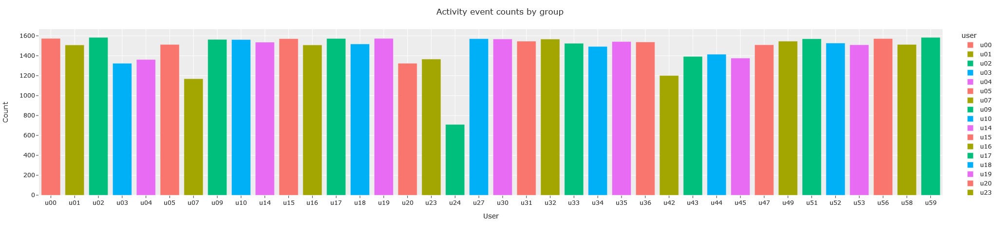

In [43]:
EDA_countplot.EDA_countplot(sf, 
                            fig_title='Activity event counts by group', 
                            plot_type='count', 
                            points='all',
                            aggregation='user', 
                            user=None, 
                            column=None,
                            binning=False)

## 2.2. Group level observation count <a class="anchor" id="section_2_2"></a>

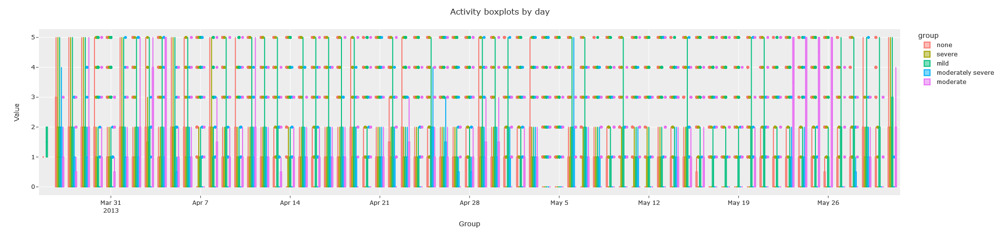

In [19]:
EDA_countplot.EDA_countplot(sf, 
                            fig_title='Activity boxplots by day', 
                            plot_type='value', 
                            points='all',
                            aggregation='group', 
                            user=None, 
                            column='activity',
                            binning='D')

## 2.3. Group level value distributions <a class="anchor" id="section_2_3"></a>

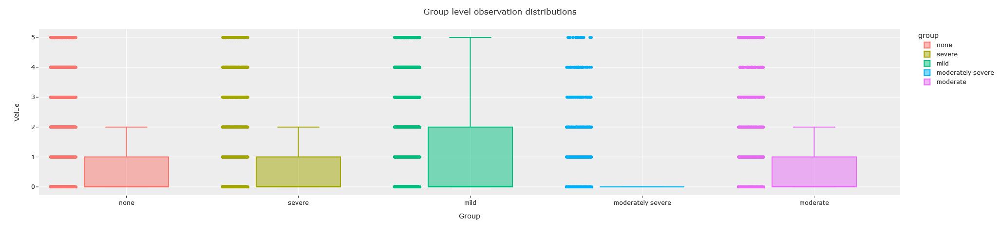

In [20]:
EDA_countplot.EDA_countplot(sf,
                            fig_title='Group level observation distributions', 
                            plot_type='value', 
                            points='all',
                            aggregation='group', 
                            user=None,
                            column='activity',
                            binning=False)

## 3. Lineplot <a class="anchor" id="section_3"></a>


This chapter shows an example lineplots using the same activity data as in previous chapter.

## 3.1. Lineplot <a class="anchor" id="section_3_1"></a>

Lineplot explanation goes here

## 3.1.1. Single user single feature <a class="anchor" id="section_3_1_1"></a>

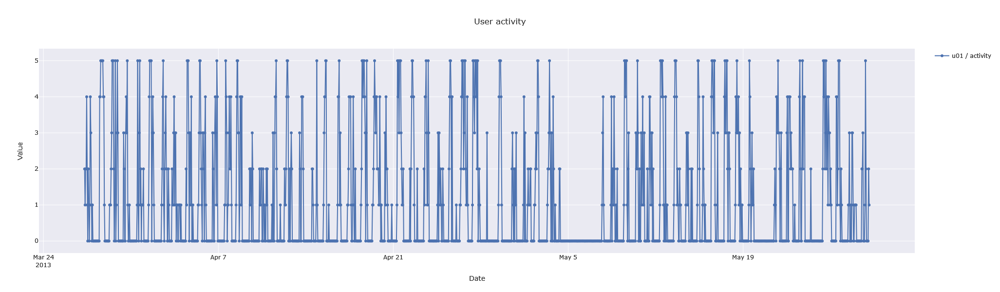

In [21]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users=['u01'],
                            columns=['activity'],
                            title='User activity',
                            xlabel='Date',
                            ylabel='Value',
                            resample=False,
                            interpolate=False,
                            window=1,
                            reset_index=False)

fig.show()

## 3.1.2. Single user single feature index resetted <a class="anchor" id="section_3_1_2"></a>

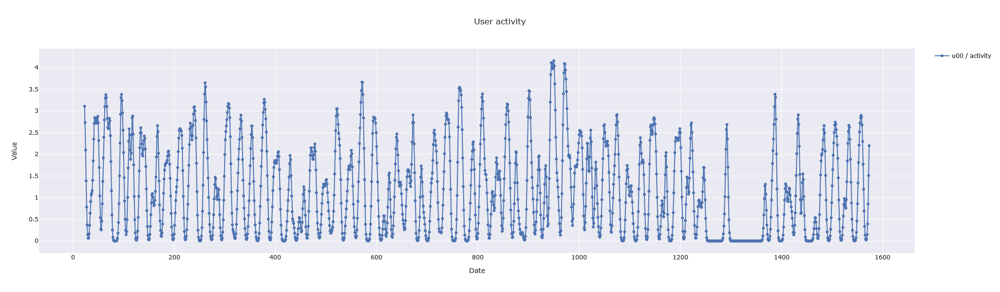

In [22]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users=['u00'],
                            columns=['activity'],
                            title='User activity',
                            xlabel='Date',
                            ylabel='Value',
                            resample='H',
                            interpolate=True,
                            window=24,
                            reset_index=True)

fig.show()

## 3.1.3. Single user single feature, aggregated by day <a class="anchor" id="section_3_1_3"></a>

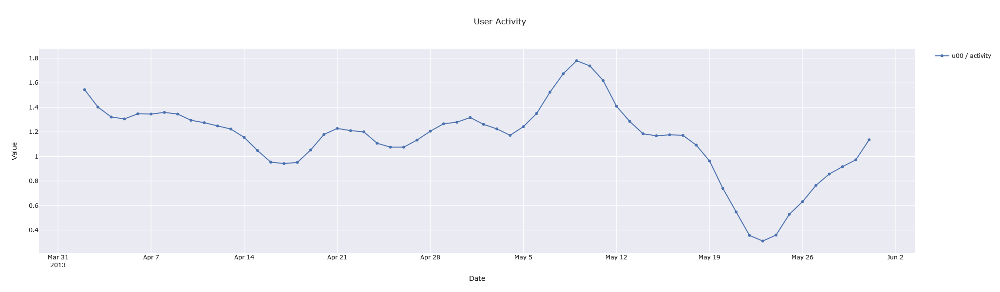

In [23]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users=['u00'],
                            columns=['activity'],
                            title='User Activity' ,
                            xlabel='Date',
                            ylabel='Value',
                            resample='D',
                            interpolate=True,
                            window=7)

fig.show()

## 3.2. Multiple subjects single feature <a class="anchor" id="section_3_2"></a>

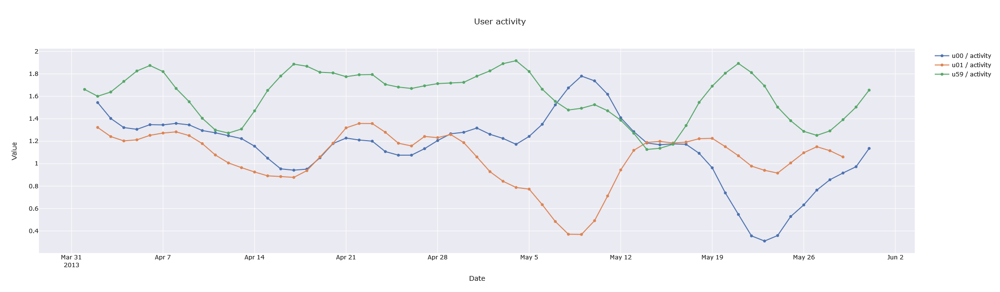

In [24]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users=['u00','u01','u59'],
                            columns=['activity'],
                            title='User activity',
                            xlabel='Date',
                            ylabel='Value',
                            resample='D',
                            interpolate=True,
                            window=7)

fig.show()

## 3.3. Group level hourly averages <a class="anchor" id="section_3_3"></a>

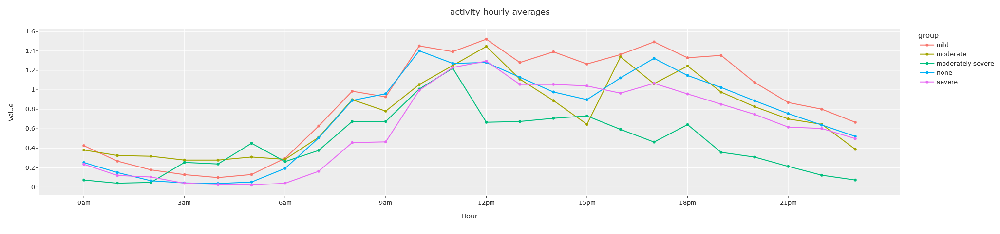

In [25]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users='Group',
                            columns=['activity'],
                            title='User Activity',
                            xlabel='Date',
                            ylabel='Value',
                            resample='D',
                            interpolate=True,
                            window=7,
                            reset_index=False,
                            by='hour')

fig.show()

## 3.4. Group level weekday averages <a class="anchor" id="section_3_4"></a>

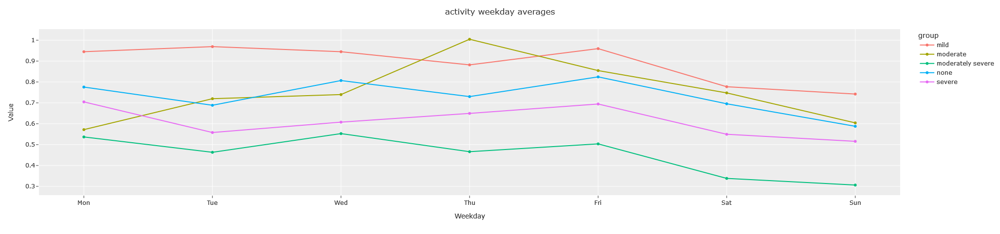

In [26]:
fig = EDA_lineplot.timeplot(sf_loc,
                            users='Group',
                            columns=['activity'],
                            title='User Activity',
                            xlabel='Date',
                            ylabel='Value',
                            resample='D',
                            interpolate=True,
                            window=7,
                            reset_index=False,
                            by='weekday')

fig.show()

## 4. Punchcard <a class="anchor" id="section_4"></a>

## 4.1. Single user punchcard <a class="anchor" id="section_4_1"></a>

In [27]:
px.defaults.color_continuous_scale = px.colors.sequential.gray

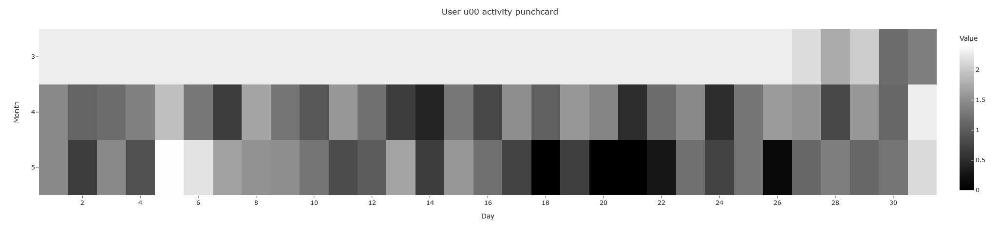

In [28]:
EDA_punchcard.punchcard_plot(sf, 
                             user_list=['u00'],
                             columns=['activity'],
                             title="User {} activity punchcard".format('u00'),
                             resample='D',
                             normalize=False,
                             agg_func=np.mean,
                             timerange=False)

## 4.2. Multiple user punchcard <a class="anchor" id="section_4_2"></a>

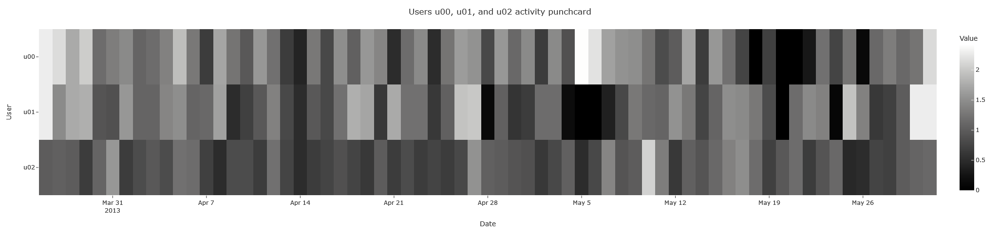

In [29]:
EDA_punchcard.punchcard_plot(sf, 
                             user_list=['u00','u01','u02'],
                             columns=['activity'],
                             title="Users {}, {}, and {} activity punchcard".format('u00','u01','u02'),
                             resample='D',
                             normalize=False,
                             agg_func=np.mean,
                             timerange=False)

## 4.3. Single user punchcard showing two features <a class="anchor" id="section_4_3"></a>

In [30]:
sf_loc['previous_week_activity'] = sf_loc['activity'].shift(periods=7, fill_value=0)

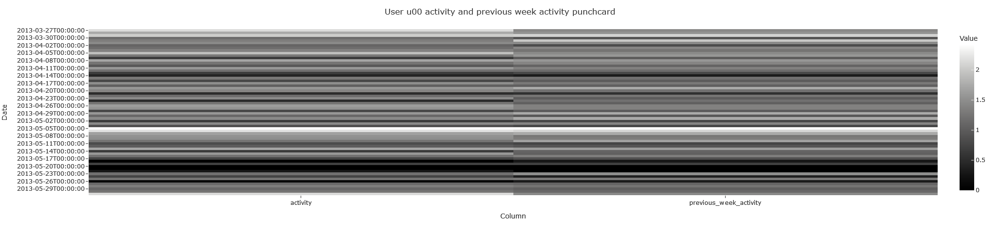

In [31]:
EDA_punchcard.punchcard_plot(sf_loc, 
                             user_list=['u00'],
                             columns=['activity','previous_week_activity'],
                             title="User {} activity and previous week activity punchcard".format('u00'),
                             resample='D',
                             normalize=False,
                             agg_func=np.mean,
                             timerange=False)

## 5) Missingness <a class="anchor" id="section_5"></a>
This sections introduces Missingness module for missing data inspection. The module features data missingness visualizations by frequency and by timepoint.<br>
Additionally, it offers an option for missing data correlation visualization.   

### Data 

For data missingness visualizations, we'll create a mock dataframe with missing values using `niimpy.util.create_missing_dataframe` function.

In [32]:
df_m = niimpy.util.create_missing_dataframe(nrows=2*24*14, ncols=5, density=0.7, index_type='dt', freq='10T')
df_m.columns = ['User_1','User_2','User_3','User_4','User_5',]

We will quickly inspect the dataframe before the visualizations.

In [33]:
df_m

,User_1,User_2,User_3,User_4,User_5
2022-01-01 00:00:00,NaN,63.697933,81.750482,77.030854,90.100341
2022-01-01 00:10:00,5.097191,NaN,31.465823,NaN,13.958901
2022-01-01 00:20:00,98.381863,38.037259,64.851003,1.104944,29.869865
2022-01-01 00:30:00,83.805471,38.033091,47.239964,76.696100,NaN
2022-01-01 00:40:00,2.490354,NaN,8.197858,92.455124,19.531483
...,...,...,...,...,...
2022-01-05 15:10:00,47.740130,5.547782,45.417760,17.060947,75.183553
2022-01-05 15:20:00,3.824831,NaN,7.103475,73.008056,45.146900
2022-01-05 15:30:00,NaN,NaN,NaN,56.921703,40.400029
2022-01-05 15:40:00,33.233931,22.432827,48.679522,NaN,9.994362


In [34]:
df_m.describe()

,User_1,User_2,User_3,User_4,User_5
count,460.000000,475.000000,463.000000,467.000000,487.000000
mean,51.058002,48.967168,50.802983,50.859564,51.373166
std,29.376943,28.394044,29.164857,28.569418,28.400996
min,1.002042,1.013329,1.001436,1.104944,1.600354
25%,25.464514,23.540897,26.062506,25.458211,25.897050
50%,53.278474,48.505198,50.115065,49.481211,53.465840
75%,75.352498,72.699652,76.325661,76.619378,75.685097
max,99.837232,99.938595,99.730115,99.849350,99.898536


## 5.1. Data frequency by feature <a class="anchor" id="section_5_1"></a>

First, we create a histogram to visualize data frequency per column.

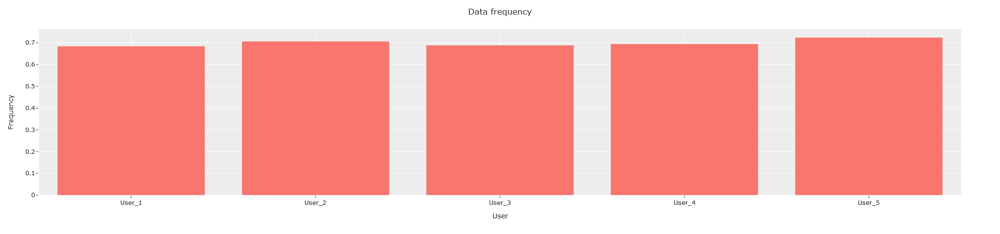

In [35]:
fig = EDA_missingness.bar(df_m,
                          xaxis_title='User',
                          yaxis_title='Frequency')
fig.show()

## 5.2. Average frequency by user <a class="anchor" id="section_5_2"></a>
NEext, we will show average data frequency for all users.

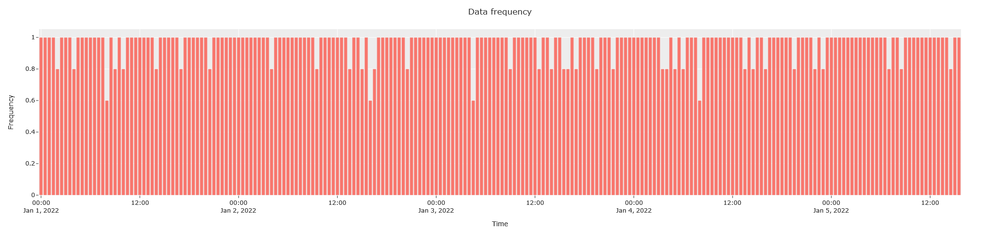

In [36]:
fig = EDA_missingness.bar(df_m, 
                          sampling_freq='30T',
                          xaxis_title='Time',
                          yaxis_title='Frequency')
fig.show()

## 5.3. Missingness matrix <a class="anchor" id="section_5_3"></a>
We can also create a missingness matrix visualization for the dataframe. The matrix show data missingess by a timepoint.

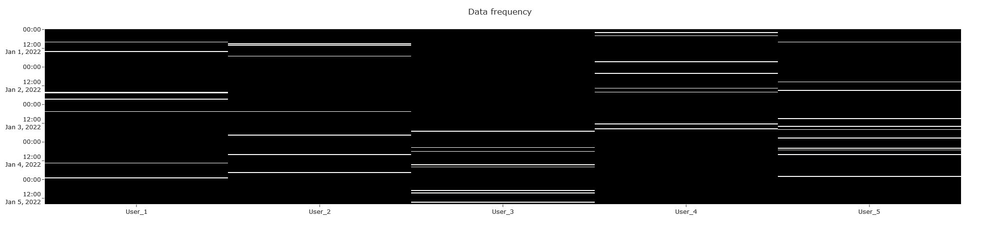

In [37]:
fig = EDA_missingness.matrix(df_m,
                             sampling_freq='30T',
                             xaxis_title="User ID",
                             yaxis_title="Time")
fig.show()

## 5.4. Missing data correlations <a class="anchor" id="section_5_4"></a>

Finally, we plot a heatmap to display the correlations between missing data.

Correlation ranges from -1 to 1: 
* -1 means that if one variable appears then the other will be missing. 
* 0 means that there is no correlation between the missingness of two variables. 
* 1 means that the two variables will always appear together.

### Data
For the correlations, we use *NYC collision factors* [sample data](#https://github.com/ResidentMario/missingno). 

In [38]:
collisions = pd.read_csv("https://raw.githubusercontent.com/ResidentMario/missingno-data/master/nyc_collision_factors.csv")

In [39]:
collisions

,DATE,TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,11/10/2016,16:11:00,BROOKLYN,11208.0,40.662514,-73.872007,"(40.6625139, -73.8720068)",WORTMAN AVENUE,MONTAUK AVENUE,NaN,...,Failure to Yield Right-of-Way,Unspecified,NaN,NaN,NaN,TAXI,PASSENGER VEHICLE,NaN,NaN,NaN
1,11/10/2016,05:11:00,MANHATTAN,10013.0,40.721323,-74.008344,"(40.7213228, -74.0083444)",HUBERT STREET,HUDSON STREET,NaN,...,Failure to Yield Right-of-Way,NaN,NaN,NaN,NaN,PASSENGER VEHICLE,NaN,NaN,NaN,NaN
2,04/16/2016,09:15:00,BROOKLYN,11201.0,40.687999,-73.997563,"(40.6879989, -73.9975625)",HENRY STREET,WARREN STREET,NaN,...,Lost Consciousness,Lost Consciousness,NaN,NaN,NaN,PASSENGER VEHICLE,VAN,NaN,NaN,NaN
3,04/15/2016,10:20:00,QUEENS,11375.0,40.719228,-73.854542,"(40.7192276, -73.8545422)",NaN,NaN,67-64 FLEET STREET,...,Failure to Yield Right-of-Way,Failure to Yield Right-of-Way,Failure to Yield Right-of-Way,NaN,NaN,PASSENGER VEHICLE,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN
4,04/15/2016,10:35:00,BROOKLYN,11210.0,40.632147,-73.952731,"(40.6321467, -73.9527315)",BEDFORD AVENUE,CAMPUS ROAD,NaN,...,Failure to Yield Right-of-Way,Failure to Yield Right-of-Way,NaN,NaN,NaN,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7298,01/07/2016,21:30:00,BROOKLYN,11235.0,40.584305,-73.959113,"(40.5843046, -73.9591125)",EAST 11 STREET,BLAKE COURT,NaN,...,Lost Consciousness,Unspecified,NaN,NaN,NaN,SPORT UTILITY / STATION WAGON,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN
7299,01/06/2016,12:50:00,BROOKLYN,11220.0,40.638583,-74.020772,"(40.6385828, -74.0207721)",4 AVENUE,64 STREET,NaN,...,Failure to Yield Right-of-Way,Unspecified,NaN,NaN,NaN,PASSENGER VEHICLE,SPORT UTILITY / STATION WAGON,NaN,NaN,NaN
7300,01/04/2016,17:45:00,BROOKLYN,11235.0,40.581744,-73.953836,"(40.5817444, -73.9538363)",SHORE BOULEVARD,CASS PLACE,NaN,...,Failure to Yield Right-of-Way,Unspecified,NaN,NaN,NaN,PASSENGER VEHICLE,PASSENGER VEHICLE,NaN,NaN,NaN
7301,01/02/2016,17:20:00,MANHATTAN,10016.0,40.750960,-73.982723,"(40.7509597, -73.9827227)",WEST 38 STREET,5 AVENUE,NaN,...,Lost Consciousness,Lost Consciousness,NaN,NaN,NaN,PASSENGER VEHICLE,TAXI,NaN,NaN,NaN


In [40]:
collisions.describe

<bound method NDFrame.describe of             DATE      TIME    BOROUGH  ZIP CODE   LATITUDE  LONGITUDE  \
0     11/10/2016  16:11:00   BROOKLYN   11208.0  40.662514 -73.872007   
1     11/10/2016  05:11:00  MANHATTAN   10013.0  40.721323 -74.008344   
2     04/16/2016  09:15:00   BROOKLYN   11201.0  40.687999 -73.997563   
3     04/15/2016  10:20:00     QUEENS   11375.0  40.719228 -73.854542   
4     04/15/2016  10:35:00   BROOKLYN   11210.0  40.632147 -73.952731   
...          ...       ...        ...       ...        ...        ...   
7298  01/07/2016  21:30:00   BROOKLYN   11235.0  40.584305 -73.959113   
7299  01/06/2016  12:50:00   BROOKLYN   11220.0  40.638583 -74.020772   
7300  01/04/2016  17:45:00   BROOKLYN   11235.0  40.581744 -73.953836   
7301  01/02/2016  17:20:00  MANHATTAN   10016.0  40.750960 -73.982723   
7302  01/02/2016  20:00:00   BROOKLYN   11213.0  40.663604 -73.934391   

                       LOCATION      ON STREET NAME CROSS STREET NAME  \
0     (40.662513

Finally, we will visualize the correlations by a heatmap and a dendrogram.

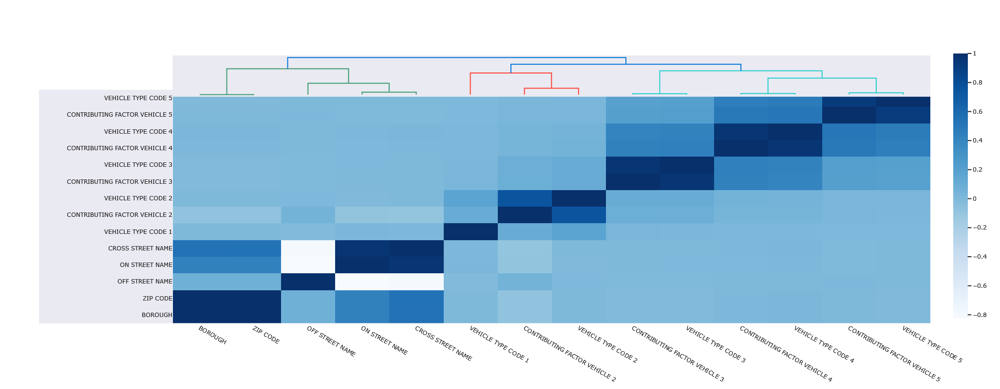

In [41]:
fig = EDA_missingness.heatmap(collisions)
fig.show()